# 02 — Data Pipeline

**Project:** Tomato Quality Semantic Segmentation — Background Bias Analysis  
**Models:** U-Net with MobileNetV2 & EfficientNet-B0 Encoders  

## What this notebook does

1. Loads shared config and the fixed train/val/test splits from notebook 01  
2. Defines mask generation functions (polygon → pixel-wise semantic mask)  
3. Defines augmentation pipelines for train / val / test  
4. Defines `TomatoSegDataset` supporting three background modes: `natural`, `removed`, `synthetic`  
5. Computes inverse-frequency class weights **from the training split only** and saves them  
6. Generates 200 procedural synthetic background images  
7. Creates and validates all DataLoaders (3 modes × 3 splits = 9 loaders)  
8. Saves everything needed by notebooks 03–06 to disk  

> **Split policy:** Train/Val/Test indices were fixed in notebook 01 and loaded here from `outputs/dataset_splits.json`. Nothing is re-split or re-randomized.

## 1. Imports

In [1]:
import os
import sys
import json
import glob
import random
import warnings
from pathlib import Path
from collections import defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import cv2

import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import albumentations as A
from albumentations.pytorch import ToTensorV2

warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['figure.dpi']    = 100

print('Imports OK')

Imports OK


## 2. Load Shared Config

In [2]:
# config.py lives in the project root (one level up from notebooks/)
sys.path.insert(0, str(Path('..').resolve()))
from config import *

print(f'Device          : {DEVICE}')
print(f'NUM_CLASSES     : {NUM_CLASSES}')
print(f'IMG_SIZE        : {IMG_SIZE}')
print(f'TRAIN_IMG_DIR   : {TRAIN_IMG_DIR}')
print(f'SPLIT_FILE      : {SPLIT_FILE}')
print(f'OUTPUT_DIR      : {OUTPUT_DIR}')

Device          : cpu
NUM_CLASSES     : 7
IMG_SIZE        : 512
TRAIN_IMG_DIR   : C:\Personal Data\Thesis\tomato-background-bias\data\tomato-dataset\Train\img
SPLIT_FILE      : C:\Personal Data\Thesis\tomato-background-bias\outputs\dataset_splits.json
OUTPUT_DIR      : C:\Personal Data\Thesis\tomato-background-bias\outputs


## 3. Load Fixed Splits

In [3]:
assert SPLIT_FILE.exists(), f'Split file not found: {SPLIT_FILE}. Run notebook 01 first.'

with open(SPLIT_FILE, 'r') as f:
    split_data = json.load(f)

# Reconstruct (img_path, ann_path) tuples from stored strings
# train_pairs = [(Path(img), Path(ann)) for img, ann in split_data['train']]
# val_pairs   = [(Path(img), Path(ann)) for img, ann in split_data['val']]
# test_pairs  = [(Path(img), Path(ann)) for img, ann in split_data['test']]
train_pairs = [(INPUT_DIR / img, INPUT_DIR / ann)
               for img, ann in split_data['train']]
val_pairs = [(INPUT_DIR / img, INPUT_DIR / ann)
             for img, ann in split_data['val']]
test_pairs = [(INPUT_DIR / img, INPUT_DIR / ann)
              for img, ann in split_data['test']]

print(f'Loaded splits  (seed={split_data["seed"]})')
print(f'  Train : {len(train_pairs)}')
print(f'  Val   : {len(val_pairs)}')
print(f'  Test  : {len(test_pairs)}')

# Verify all files still exist
missing = []
for pairs, name in [(train_pairs,'train'), (val_pairs,'val'), (test_pairs,'test')]:
    for img_p, ann_p in pairs:
        if not img_p.exists(): missing.append(f'[{name}] IMG missing: {img_p}')
        if not ann_p.exists(): missing.append(f'[{name}] ANN missing: {ann_p}')

if missing:
    print(f'\n⚠️  {len(missing)} missing files:')
    for m in missing[:10]: print(f'  {m}')
else:
    print('\n✅ All files verified.')

Loaded splits  (seed=42)
  Train : 447
  Val   : 93
  Test  : 103

✅ All files verified.


## 4. Mask Generation Functions

In [4]:
def generate_mask_from_annotation(ann_path, img_height=None, img_width=None):
    """
    Convert a Supervisely JSON annotation to a semantic segmentation mask.

    Args:
        ann_path   : Path to annotation JSON
        img_height : override height (uses annotation size if None)
        img_width  : override width  (uses annotation size if None)

    Returns:
        mask : np.ndarray shape (H, W) dtype uint8, values 0-6
    """
    with open(ann_path, 'r') as f:
        ann = json.load(f)

    h = img_height or ann['size']['height']
    w = img_width  or ann['size']['width']
    mask = np.zeros((h, w), dtype=np.uint8)   # 0 = background

    # Group by class title for priority-based painting
    objects_by_class = defaultdict(list)
    for obj in ann['objects']:
        ct = obj.get('classTitle', '')
        if ct in CLASS_TITLE_TO_IDX:
            objects_by_class[ct].append(obj)

    # Paint most-common first, rarest last → rare classes never overwritten
    for cls_title in PAINT_PRIORITY:
        if cls_title not in objects_by_class:
            continue
        cls_idx = CLASS_TITLE_TO_IDX[cls_title]
        for obj in objects_by_class[cls_title]:
            pts = np.array(obj['points']['exterior'], dtype=np.int32)
            cv2.fillPoly(mask, [pts], cls_idx)

    return mask


def get_foreground_binary_mask(ann_path, img_height=None, img_width=None):
    """
    Binary foreground mask: 1 = any annotated object, 0 = background.
    Used for background removal (Step 2) and synthetic BG compositing (Step 3).
    """
    with open(ann_path, 'r') as f:
        ann = json.load(f)

    h = img_height or ann['size']['height']
    w = img_width  or ann['size']['width']
    fg_mask = np.zeros((h, w), dtype=np.uint8)

    for obj in ann['objects']:
        if obj.get('classTitle', '') in CLASS_TITLE_TO_IDX:
            pts = np.array(obj['points']['exterior'], dtype=np.int32)
            cv2.fillPoly(fg_mask, [pts], 1)

    return fg_mask


print('Mask generation functions defined.')

Mask generation functions defined.


### 4.1 Verify Mask Generation on Sample Images

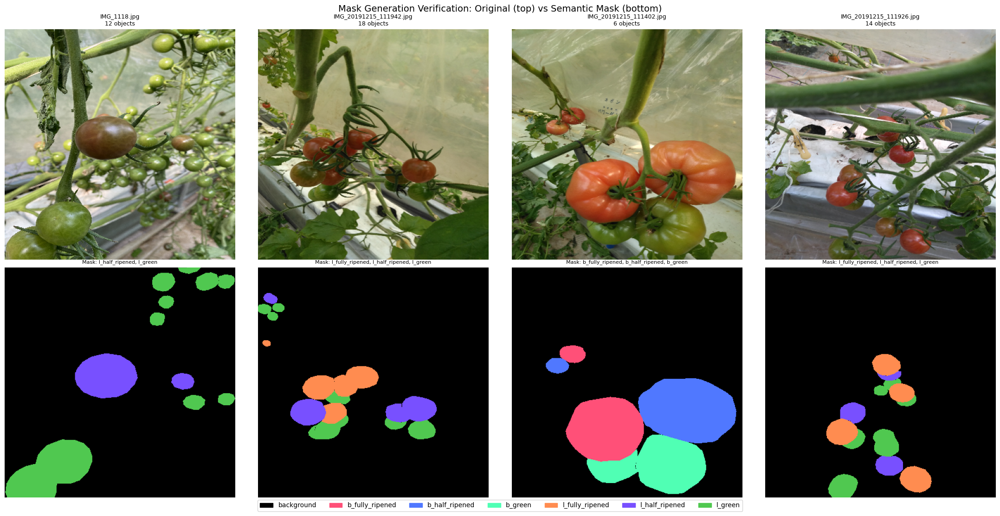

Saved: pipe_mask_verification.png


In [5]:
sample_pairs = random.sample(train_pairs, 4)

fig, axes = plt.subplots(2, 4, figsize=(22, 11))

for i, (img_p, ann_p) in enumerate(sample_pairs):
    img     = cv2.imread(str(img_p))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask    = generate_mask_from_annotation(ann_p)

    display_size = (400, 400)
    img_small    = cv2.resize(img_rgb, display_size)
    mask_small   = cv2.resize(mask, display_size, interpolation=cv2.INTER_NEAREST)

    colored_mask = np.zeros((*display_size[::-1], 3), dtype=np.uint8)
    for c in range(NUM_CLASSES):
        colored_mask[mask_small == c] = CLASS_COLORS[c]

    with open(ann_p) as f:
        ann = json.load(f)

    axes[0, i].imshow(img_small)
    axes[0, i].set_title(f'{img_p.name}\n{len(ann["objects"])} objects', fontsize=9)
    axes[0, i].axis('off')

    unique = [CLASS_NAMES[c] for c in np.unique(mask_small) if c > 0]
    axes[1, i].imshow(colored_mask)
    axes[1, i].set_title('Mask: ' + ', '.join(unique), fontsize=8)
    axes[1, i].axis('off')

patches = [mpatches.Patch(color=np.array(CLASS_COLORS[i])/255., label=CLASS_NAMES[i])
           for i in range(NUM_CLASSES)]
fig.legend(handles=patches, loc='lower center', ncol=7, fontsize=10,
           bbox_to_anchor=(0.5, -0.02))
plt.suptitle('Mask Generation Verification: Original (top) vs Semantic Mask (bottom)',
             fontsize=14)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'pipe_mask_verification.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: pipe_mask_verification.png')

## 5. Augmentation Pipelines

In [6]:
def get_train_augmentation(img_size=IMG_SIZE):
    """Training augmentations — applied to both image and mask."""
    return A.Compose([
        A.Resize(img_size, img_size),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.3),
        A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, p=0.3),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])


def get_val_augmentation(img_size=IMG_SIZE):
    """Validation augmentations — resize and normalize only."""
    return A.Compose([
        A.Resize(img_size, img_size),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])


def get_test_augmentation(img_size=IMG_SIZE):
    """Test augmentations — resize and normalize only."""
    return A.Compose([
        A.Resize(img_size, img_size),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])


print('Augmentation pipelines defined.')

Augmentation pipelines defined.


## 6. TomatoSegDataset

In [7]:
class TomatoSegDataset(Dataset):
    """
    PyTorch Dataset for Laboro Tomato semantic segmentation.

    Background modes
    ----------------
    'natural'   : original farm images                          (Step 1)
    'removed'   : background replaced with neutral gray (128)   (Step 2)
    'synthetic' : background replaced with a random BG image    (Step 3)

    Parameters
    ----------
    pairs      : list of (img_path, ann_path) tuples — fixed by notebook 01
    transform  : albumentations transform
    bg_mode    : 'natural' | 'removed' | 'synthetic'
    bg_images  : list of background image paths (only for 'synthetic' mode)
    """

    def __init__(self, pairs, transform=None, bg_mode='natural', bg_images=None):
        self.pairs     = pairs          # list[(Path, Path)]
        self.transform = transform
        self.bg_mode   = bg_mode
        self.bg_images = bg_images or []

        # Validate that all files exist
        missing = [(str(i), str(a)) for i, a in pairs
                   if not i.exists() or not a.exists()]
        if missing:
            raise FileNotFoundError(
                f'{len(missing)} missing file(s) in dataset. First: {missing[0]}')

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        img_p, ann_p = self.pairs[idx]

        # Load image BGR → RGB
        img = cv2.imread(str(img_p))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]

        # Semantic mask
        mask = generate_mask_from_annotation(ann_p, h, w)

        # ── Background modification ──────────────────────────────────────────
        if self.bg_mode == 'removed':
            fg = get_foreground_binary_mask(ann_p, h, w)
            bg = np.full_like(img, NEUTRAL_BG_COLOR, dtype=np.uint8)
            fg3 = np.stack([fg] * 3, axis=-1)
            img = np.where(fg3 == 1, img, bg)

        elif self.bg_mode == 'synthetic' and len(self.bg_images) > 0:
            fg = get_foreground_binary_mask(ann_p, h, w)
            bg_path = random.choice(self.bg_images)
            bg_img  = cv2.imread(bg_path)
            if bg_img is not None:
                bg_img = cv2.cvtColor(bg_img, cv2.COLOR_BGR2RGB)
                bg_img = cv2.resize(bg_img, (w, h))
            else:
                bg_img = np.random.randint(0, 255, img.shape, dtype=np.uint8)
            fg3 = np.stack([fg] * 3, axis=-1)
            img = np.where(fg3 == 1, img, bg_img)

        # ── Augmentation ─────────────────────────────────────────────────────
        if self.transform:
            out  = self.transform(image=img, mask=mask)
            img  = out['image']   # (3, H, W) float tensor
            mask = out['mask']    # (H, W) long tensor

        return img, mask.long()


print('TomatoSegDataset defined.')

TomatoSegDataset defined.


## 7. Compute Class Weights (Training Split Only)

In [9]:
def compute_class_weights_from_pairs(pairs, num_classes=NUM_CLASSES,
                                     img_size=IMG_SIZE, sample_size=250):
    """
    Estimate pixel-level class frequencies from a random sample of pairs.
    Returns inverse-frequency weights normalised to sum to num_classes.

    Uses only the provided pairs (i.e. the training split) to avoid
    any data leakage from val/test.
    """
    rng    = random.Random(SEED)
    sample = rng.sample(pairs, min(sample_size, len(pairs)))

    pixel_counts = np.zeros(num_classes, dtype=np.float64)

    for img_p, ann_p in sample:
        with open(ann_p) as f:
            ann = json.load(f)
        h = ann['size']['height']
        w = ann['size']['width']
        mask = generate_mask_from_annotation(ann_p, h, w)
        mask_r = cv2.resize(mask, (img_size, img_size),
                            interpolation=cv2.INTER_NEAREST)
        for c in range(num_classes):
            pixel_counts[c] += (mask_r == c).sum()

    total  = pixel_counts.sum()
    freq   = pixel_counts / total
    freq   = np.maximum(freq, 1e-8)      # avoid division by zero
    w      = 1.0 / freq
    w      = w / w.sum() * num_classes   # normalise
    return w, pixel_counts, freq


print('Computing class weights from training split only...')
class_weights, pixel_counts, pixel_freq = compute_class_weights_from_pairs(train_pairs)

weight_df = pd.DataFrame({
    'Class'      : CLASS_NAMES,
    'Pixel Count': pixel_counts.astype(int),
    'Frequency %': (pixel_freq * 100).round(3),
    'Weight'     : class_weights.round(4),
})
print('\n=== Class Pixel Frequencies & Weights (train split only) ===')
print(weight_df.to_string(index=False))

# ── Save weights so downstream notebooks can load them ───────────────────────
WEIGHTS_FILE = OUTPUT_DIR / 'class_weights.npy'
np.save(WEIGHTS_FILE, class_weights)
print(f'\nSaved class weights → {WEIGHTS_FILE}')

# ── Create tensor for immediate use ──────────────────────────────────────────
class_weights_tensor = torch.FloatTensor(class_weights).to(DEVICE)
print(f'class_weights_tensor: {class_weights_tensor}')

Computing class weights from training split only...

=== Class Pixel Frequencies & Weights (train split only) ===
          Class  Pixel Count  Frequency %  Weight
     background     57383601       87.560  0.0227
b_fully_ripened       826998        1.262  1.5775
 b_half_ripened      1024471        1.563  1.2734
        b_green      2045887        3.122  0.6377
l_fully_ripened      1145470        1.748  1.1389
 l_half_ripened       723545        1.104  1.8030
        l_green      2386028        3.641  0.5468

Saved class weights → C:\Personal Data\Thesis\tomato-background-bias\outputs\class_weights.npy
class_weights_tensor: tensor([0.0227, 1.5775, 1.2734, 0.6377, 1.1389, 1.8030, 0.5468])


### 7.1 Class Weight Visualisation

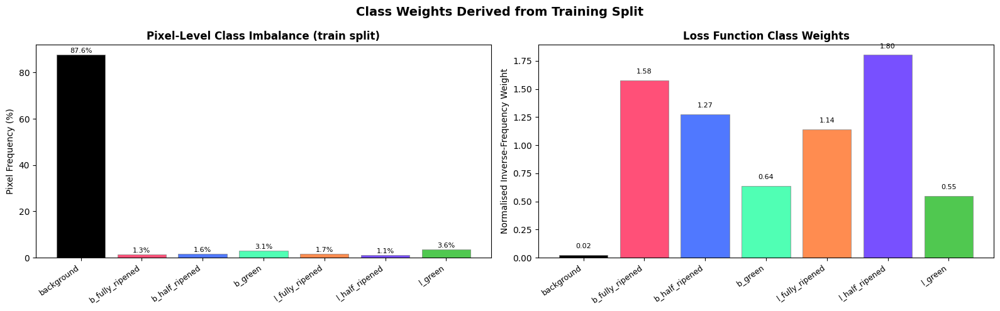

Saved: pipe_class_weights.png


In [10]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

bar_cols = [np.array(CLASS_COLORS[i]) / 255. for i in range(NUM_CLASSES)]

axes[0].bar(CLASS_NAMES, pixel_freq * 100, color=bar_cols,
            edgecolor='grey', linewidth=0.5)
axes[0].set_xticklabels(CLASS_NAMES, rotation=35, ha='right', fontsize=9)
axes[0].set_ylabel('Pixel Frequency (%)')
axes[0].set_title('Pixel-Level Class Imbalance (train split)', fontsize=12,
                   fontweight='bold')
for i, v in enumerate(pixel_freq * 100):
    axes[0].text(i, v + 0.3, f'{v:.1f}%', ha='center', va='bottom', fontsize=8)

axes[1].bar(CLASS_NAMES, class_weights, color=bar_cols,
            edgecolor='grey', linewidth=0.5)
axes[1].set_xticklabels(CLASS_NAMES, rotation=35, ha='right', fontsize=9)
axes[1].set_ylabel('Normalised Inverse-Frequency Weight')
axes[1].set_title('Loss Function Class Weights', fontsize=12, fontweight='bold')
for i, v in enumerate(class_weights):
    axes[1].text(i, v + 0.05, f'{v:.2f}', ha='center', va='bottom', fontsize=8)

plt.suptitle('Class Weights Derived from Training Split', fontsize=14,
             fontweight='bold')
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'pipe_class_weights.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: pipe_class_weights.png')

## 8. Synthetic Background Generation

In [11]:
def generate_synthetic_backgrounds(output_dir, num_backgrounds=200,
                                   img_size=(512, 512), seed=SEED):
    """
    Generate diverse procedural background images and save to disk.
    Types: solid, gradient_h, gradient_v, gradient_diag,
           noise, checkerboard, stripes, circles.

    Returns list of file path strings.
    """
    bg_dir = Path(output_dir) / 'synthetic_backgrounds'
    bg_dir.mkdir(parents=True, exist_ok=True)

    # If already generated, skip and return existing paths
    existing = sorted(bg_dir.glob('bg_*.png'))
    if len(existing) >= num_backgrounds:
        print(f'Found {len(existing)} existing backgrounds — skipping generation.')
        return [str(p) for p in existing[:num_backgrounds]]

    rng      = random.Random(seed)
    bg_paths = []
    bg_types = ['solid', 'gradient_h', 'gradient_v', 'gradient_diag',
                'noise', 'checkerboard', 'stripes', 'circles']

    for i in range(num_backgrounds):
        h, w   = img_size
        bg_type = rng.choice(bg_types)

        if bg_type == 'solid':
            color = [rng.randint(0, 255) for _ in range(3)]
            img   = np.full((h, w, 3), color, dtype=np.uint8)

        elif bg_type.startswith('gradient'):
            c1 = np.array([rng.randint(0, 255) for _ in range(3)], dtype=np.float32)
            c2 = np.array([rng.randint(0, 255) for _ in range(3)], dtype=np.float32)
            if bg_type == 'gradient_h':
                t   = np.linspace(0, 1, w).reshape(1, -1, 1)
                img = np.broadcast_to((c1 * (1 - t) + c2 * t).astype(np.uint8),
                                      (h, w, 3)).copy()
            elif bg_type == 'gradient_v':
                t   = np.linspace(0, 1, h).reshape(-1, 1, 1)
                img = np.broadcast_to((c1 * (1 - t) + c2 * t).astype(np.uint8),
                                      (h, w, 3)).copy()
            else:   # diagonal
                tx  = np.linspace(0, 1, w).reshape(1, -1)
                ty  = np.linspace(0, 1, h).reshape(-1, 1)
                t   = ((tx + ty) / 2).reshape(h, w, 1)
                img = (c1 * (1 - t) + c2 * t).astype(np.uint8)

        elif bg_type == 'noise':
            img   = np.random.randint(0, 255, (h, w, 3), dtype=np.uint8)
            ksize = rng.choice([5, 11, 21, 31])
            img   = cv2.GaussianBlur(img, (ksize, ksize), 0)

        elif bg_type == 'checkerboard':
            cs  = rng.choice([16, 32, 64, 128])
            c1  = [rng.randint(0, 255) for _ in range(3)]
            c2  = [rng.randint(0, 255) for _ in range(3)]
            img = np.zeros((h, w, 3), dtype=np.uint8)
            for y in range(0, h, cs):
                for x in range(0, w, cs):
                    img[y:y+cs, x:x+cs] = c1 if ((y//cs + x//cs) % 2 == 0) else c2

        elif bg_type == 'stripes':
            sw  = rng.choice([8, 16, 32, 64])
            c1  = [rng.randint(0, 255) for _ in range(3)]
            c2  = [rng.randint(0, 255) for _ in range(3)]
            img = np.zeros((h, w, 3), dtype=np.uint8)
            if rng.random() > 0.5:
                for y in range(0, h, sw * 2):
                    img[y:y+sw, :]       = c1
                    img[y+sw:y+sw*2, :] = c2
            else:
                for x in range(0, w, sw * 2):
                    img[:, x:x+sw]       = c1
                    img[:, x+sw:x+sw*2] = c2

        elif bg_type == 'circles':
            base = [rng.randint(0, 255) for _ in range(3)]
            img  = np.full((h, w, 3), base, dtype=np.uint8)
            for _ in range(rng.randint(5, 30)):
                cx  = rng.randint(0, w)
                cy  = rng.randint(0, h)
                r   = rng.randint(20, 150)
                col = [rng.randint(0, 255) for _ in range(3)]
                cv2.circle(img, (cx, cy), r, col, -1)
            img = cv2.GaussianBlur(img, (5, 5), 0)

        else:
            img = np.random.randint(50, 200, (h, w, 3), dtype=np.uint8)

        path = bg_dir / f'bg_{i:04d}.png'
        cv2.imwrite(str(path), cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        bg_paths.append(str(path))

    return bg_paths


print('Generating 200 synthetic background images...')
synthetic_bg_paths = generate_synthetic_backgrounds(OUTPUT_DIR, num_backgrounds=200)
print(f'Done. Total backgrounds: {len(synthetic_bg_paths)}')

Generating 200 synthetic background images...
Found 200 existing backgrounds — skipping generation.
Done. Total backgrounds: 200


### 8.1 Visualise Sample Synthetic Backgrounds

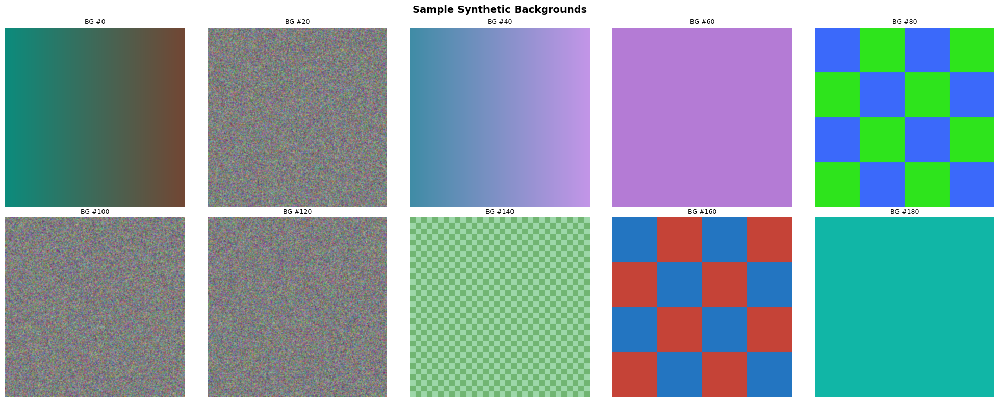

Saved: pipe_synthetic_bg_samples.png


In [12]:
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
for i, ax in enumerate(axes.flatten()):
    bg = cv2.imread(synthetic_bg_paths[i * 20])
    bg = cv2.cvtColor(bg, cv2.COLOR_BGR2RGB)
    ax.imshow(bg)
    ax.axis('off')
    ax.set_title(f'BG #{i*20}', fontsize=9)
plt.suptitle('Sample Synthetic Backgrounds', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'pipe_synthetic_bg_samples.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: pipe_synthetic_bg_samples.png')

### 8.2 Visualise Composite Examples (natural vs removed vs synthetic)

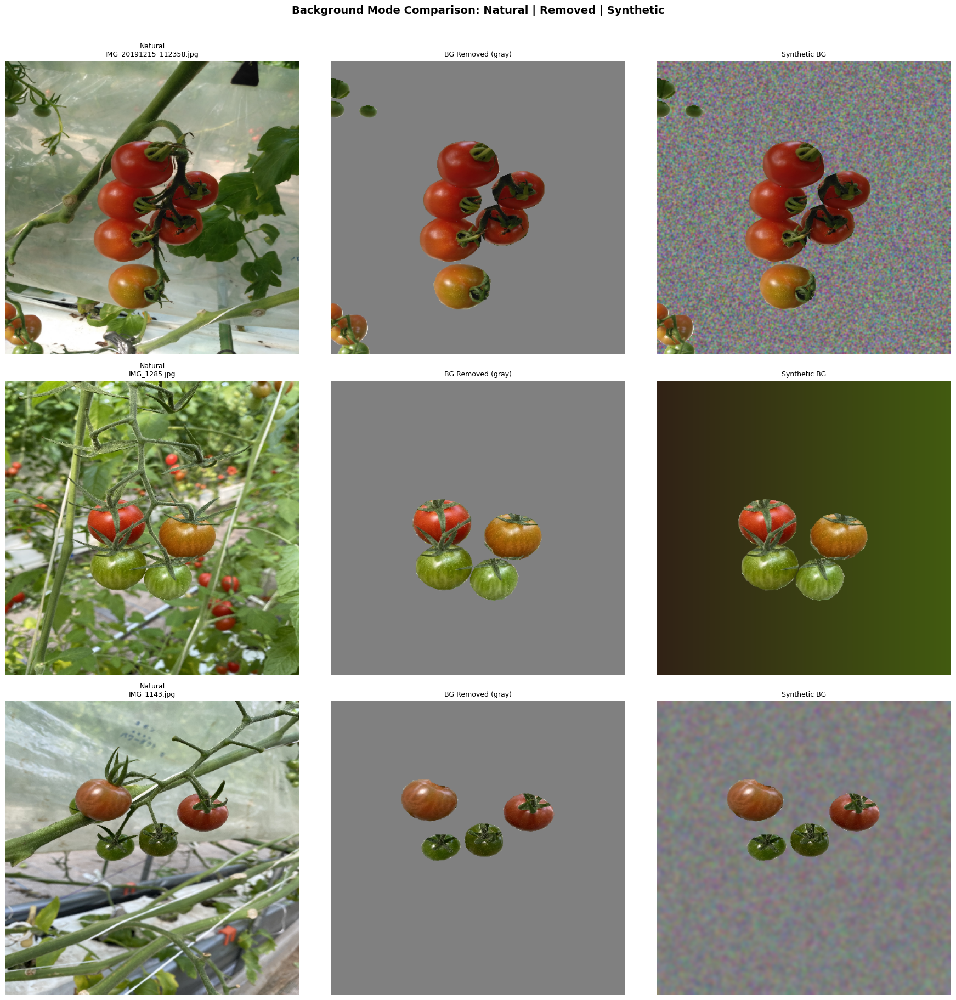

Saved: pipe_bg_mode_comparison.png


In [13]:
sample_vis = random.sample(train_pairs, 3)

fig, axes = plt.subplots(3, 3, figsize=(18, 18))

for row, (img_p, ann_p) in enumerate(sample_vis):
    img     = cv2.imread(str(img_p))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w    = img_rgb.shape[:2]
    fg      = get_foreground_binary_mask(ann_p, h, w)
    fg3     = np.stack([fg] * 3, axis=-1)

    # Natural
    nat = img_rgb.copy()

    # Removed
    bg_gray = np.full_like(img_rgb, NEUTRAL_BG_COLOR)
    rem     = np.where(fg3 == 1, img_rgb, bg_gray)

    # Synthetic
    bg_path = random.choice(synthetic_bg_paths)
    bg_img  = cv2.imread(bg_path)
    bg_img  = cv2.cvtColor(bg_img, cv2.COLOR_BGR2RGB)
    bg_img  = cv2.resize(bg_img, (w, h))
    syn     = np.where(fg3 == 1, img_rgb, bg_img)

    disp = (400, 400)
    for col, (im, title) in enumerate([
        (nat, f'Natural\n{img_p.name}'),
        (rem, 'BG Removed (gray)'),
        (syn, 'Synthetic BG'),
    ]):
        axes[row, col].imshow(cv2.resize(im, disp))
        axes[row, col].set_title(title, fontsize=9)
        axes[row, col].axis('off')

plt.suptitle('Background Mode Comparison: Natural | Removed | Synthetic',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'pipe_bg_mode_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: pipe_bg_mode_comparison.png')

## 9. Create All DataLoaders

Nine loaders total: 3 background modes × 3 splits (train / val / test).

In [15]:
def make_loaders(train_pairs, val_pairs, test_pairs,
                 bg_mode, bg_images=None):
    """
    Build train / val / test DataLoaders for a given background mode.

    Returns (train_loader, val_loader, test_loader,
              train_ds, val_ds, test_ds)
    """
    train_ds = TomatoSegDataset(train_pairs,
                                transform=get_train_augmentation(),
                                bg_mode=bg_mode, bg_images=bg_images)
    val_ds   = TomatoSegDataset(val_pairs,
                                transform=get_val_augmentation(),
                                bg_mode=bg_mode, bg_images=bg_images)
    test_ds  = TomatoSegDataset(test_pairs,
                                transform=get_test_augmentation(),
                                bg_mode=bg_mode, bg_images=bg_images)

    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE_TRAIN,
                            shuffle=True,  num_workers=NUM_WORKERS,
                            pin_memory=PIN_MEMORY, drop_last=True)
    val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE_VAL,
                            shuffle=False, num_workers=NUM_WORKERS,
                            pin_memory=PIN_MEMORY)
    test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE_TEST,
                            shuffle=False, num_workers=NUM_WORKERS,
                            pin_memory=PIN_MEMORY)

    return (train_loader, val_loader, test_loader,
            train_ds, val_ds, test_ds)


# ── Step 1: Natural background ────────────────────────────────────────────────
print('Building natural-BG loaders...')
(train_loader_natural, val_loader_natural, test_loader_natural,
 train_ds_natural,     val_ds_natural,     test_ds_natural) = make_loaders(
    train_pairs, val_pairs, test_pairs, bg_mode='natural'
)

# ── Step 2: Background removed ────────────────────────────────────────────────
print('Building BG-removed loaders...')
(train_loader_removed, val_loader_removed, test_loader_removed,
 train_ds_removed,     val_ds_removed,     test_ds_removed) = make_loaders(
    train_pairs, val_pairs, test_pairs, bg_mode='removed'
)

# ── Step 3: Synthetic background ──────────────────────────────────────────────
print('Building synthetic-BG loaders...')
(train_loader_synth, val_loader_synth, test_loader_synth,
 train_ds_synth,     val_ds_synth,     test_ds_synth) = make_loaders(
    train_pairs, val_pairs, test_pairs,
    bg_mode='synthetic', bg_images=synthetic_bg_paths
)

print('\nAll loaders created.')
print(f'  natural  — train: {len(train_ds_natural):4d} | val: {len(val_ds_natural):3d} | test: {len(test_ds_natural):3d}')
print(f'  removed  — train: {len(train_ds_removed):4d} | val: {len(val_ds_removed):3d} | test: {len(test_ds_removed):3d}')
print(f'  synthetic— train: {len(train_ds_synth):4d} | val: {len(val_ds_synth):3d} | test: {len(test_ds_synth):3d}')

Building natural-BG loaders...
Building BG-removed loaders...
Building synthetic-BG loaders...

All loaders created.
  natural  — train:  447 | val:  93 | test: 103
  removed  — train:  447 | val:  93 | test: 103
  synthetic— train:  447 | val:  93 | test: 103


## 10. Sanity Checks on All Loaders

Visualising batches:   0%|          | 0/3 [00:00<?, ?loader/s]

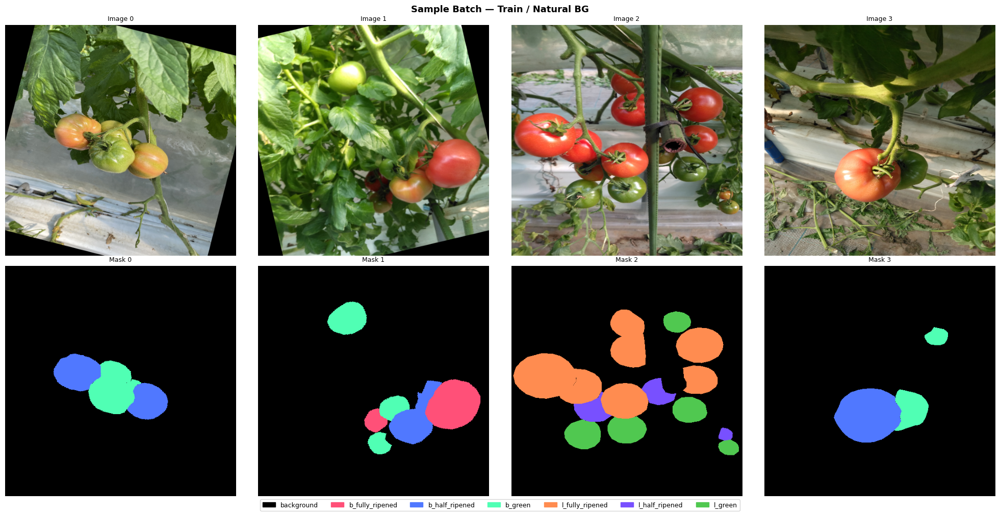

Visualising batches:  33%|███▎      | 1/3 [00:02<00:05,  2.64s/loader, done=Train / Natural BG]

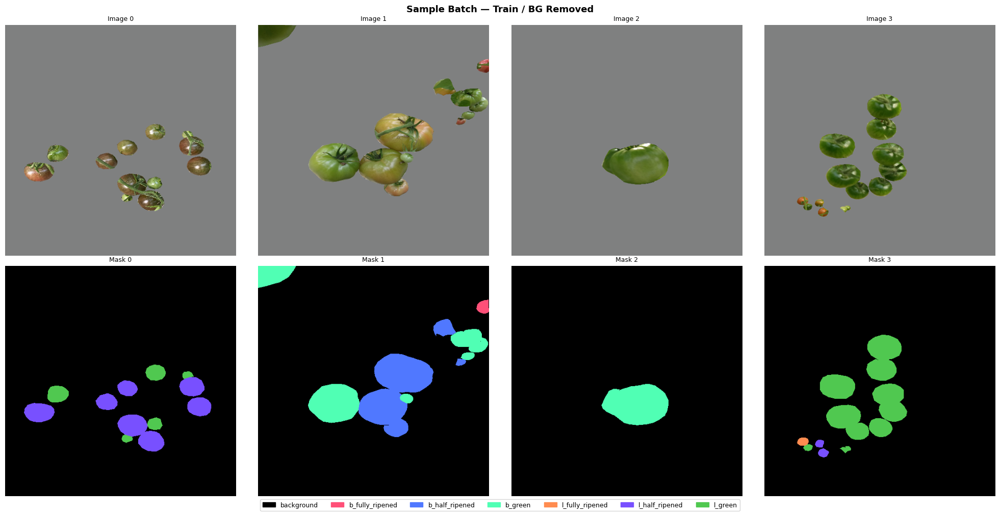

Visualising batches:  67%|██████▋   | 2/3 [00:06<00:03,  3.23s/loader, done=Train / BG Removed]

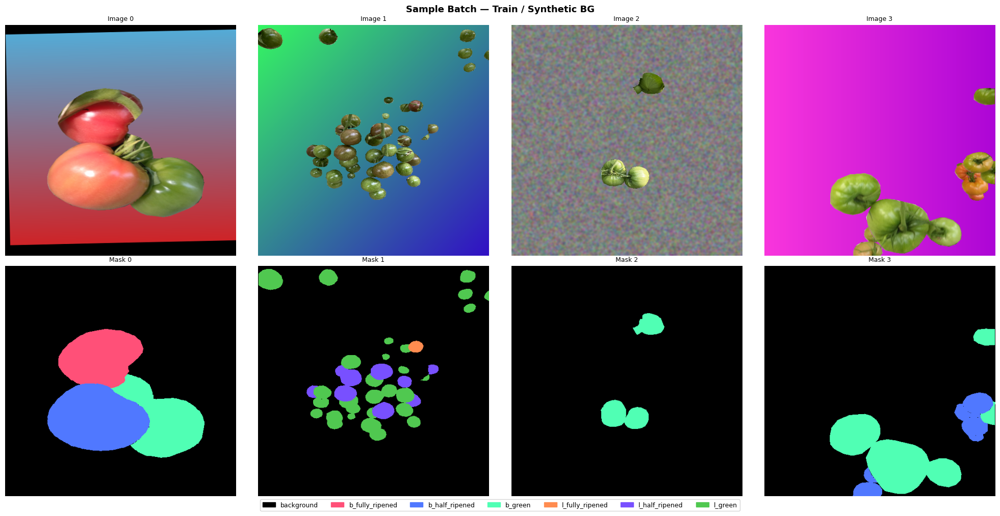

Visualising batches: 100%|██████████| 3/3 [00:09<00:00,  3.22s/loader, done=Train / Synthetic BG]

Batch visualisations saved.


In [16]:
from tqdm import tqdm

DENORM_MEAN = np.array([0.485, 0.456, 0.406])
DENORM_STD = np.array([0.229, 0.224, 0.225])


def show_batch(loader, mode_name, n=4):
    modes = [
        (train_loader_natural, 'Train / Natural BG'),
        (train_loader_removed, 'Train / BG Removed'),
        (train_loader_synth,   'Train / Synthetic BG'),
    ]

    with tqdm(total=len(modes), desc='Visualising batches', unit='loader') as pbar:
        for loader, mode_name in modes:
            imgs, masks = next(iter(loader))
            n_show = min(n, imgs.shape[0])

            fig, axes = plt.subplots(2, n_show, figsize=(5 * n_show, 10))
            for i in range(n_show):
                img_np = imgs[i].numpy().transpose(1, 2, 0)
                img_np = (img_np * DENORM_STD + DENORM_MEAN).clip(0, 1)

                mask_np = masks[i].numpy()
                colored = np.zeros((*mask_np.shape, 3), dtype=np.uint8)
                for c in range(NUM_CLASSES):
                    colored[mask_np == c] = CLASS_COLORS[c]

                axes[0, i].imshow(img_np)
                axes[0, i].set_title(f'Image {i}', fontsize=9)
                axes[0, i].axis('off')

                axes[1, i].imshow(colored)
                axes[1, i].set_title(f'Mask {i}', fontsize=9)
                axes[1, i].axis('off')

            patches = [mpatches.Patch(color=np.array(CLASS_COLORS[i])/255.,
                                      label=CLASS_NAMES[i])
                       for i in range(NUM_CLASSES)]
            fig.legend(handles=patches, loc='lower center', ncol=7, fontsize=9,
                       bbox_to_anchor=(0.5, -0.02))
            plt.suptitle(f'Sample Batch — {mode_name}',
                         fontsize=13, fontweight='bold')
            plt.tight_layout()
            safe = mode_name.replace(' ', '_').replace('/', '_')
            plt.savefig(
                OUTPUT_DIR / f'pipe_batch_{safe}.png', dpi=150, bbox_inches='tight')
            plt.show()

            pbar.set_postfix({'done': mode_name})
            pbar.update(1)


show_batch(train_loader_natural, 'Train / Natural BG')
print('Batch visualisations saved.')

### 10.1 Visualise One Batch per Mode

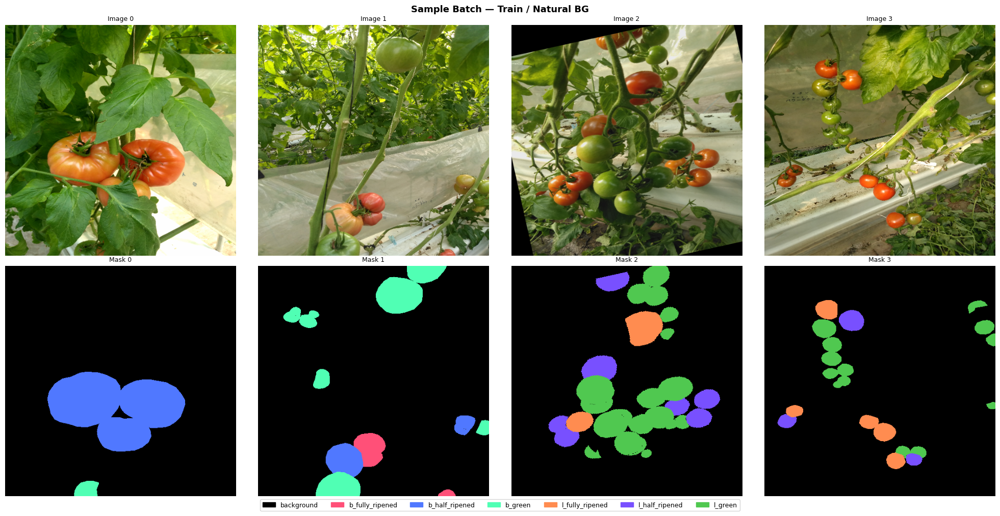

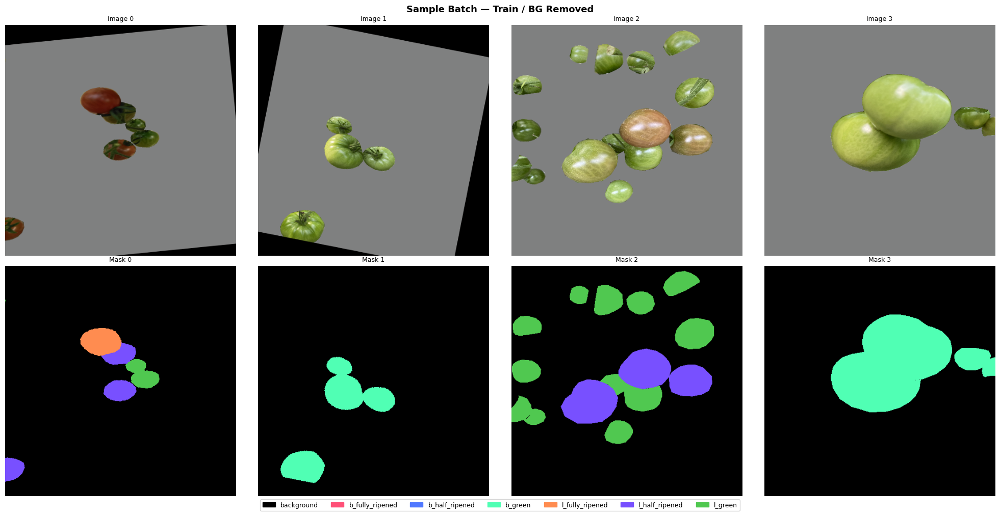

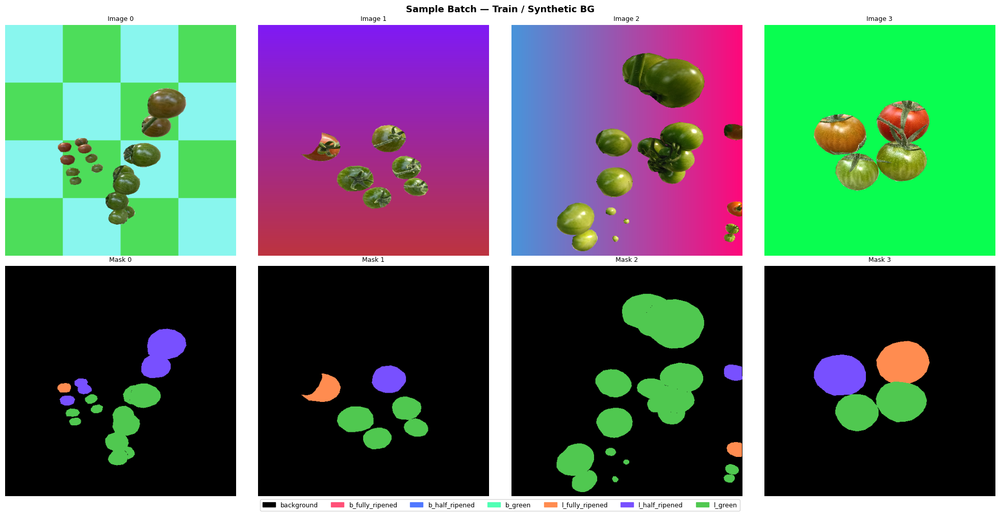

Batch visualisations saved.


In [17]:
DENORM_MEAN = np.array([0.485, 0.456, 0.406])
DENORM_STD  = np.array([0.229, 0.224, 0.225])

def show_batch(loader, mode_name, n=4):
    imgs, masks = next(iter(loader))
    n = min(n, imgs.shape[0])

    fig, axes = plt.subplots(2, n, figsize=(5 * n, 10))
    for i in range(n):
        # Denormalise image
        img_np = imgs[i].numpy().transpose(1, 2, 0)
        img_np = (img_np * DENORM_STD + DENORM_MEAN).clip(0, 1)

        # Colour mask
        mask_np = masks[i].numpy()
        colored = np.zeros((*mask_np.shape, 3), dtype=np.uint8)
        for c in range(NUM_CLASSES):
            colored[mask_np == c] = CLASS_COLORS[c]

        axes[0, i].imshow(img_np)
        axes[0, i].set_title(f'Image {i}', fontsize=9)
        axes[0, i].axis('off')

        axes[1, i].imshow(colored)
        axes[1, i].set_title(f'Mask {i}', fontsize=9)
        axes[1, i].axis('off')

    patches = [mpatches.Patch(color=np.array(CLASS_COLORS[i])/255.,
                              label=CLASS_NAMES[i])
               for i in range(NUM_CLASSES)]
    fig.legend(handles=patches, loc='lower center', ncol=7, fontsize=9,
               bbox_to_anchor=(0.5, -0.02))
    plt.suptitle(f'Sample Batch — {mode_name}', fontsize=13, fontweight='bold')
    plt.tight_layout()
    safe = mode_name.replace(' ', '_').replace('/', '_')
    plt.savefig(OUTPUT_DIR / f'pipe_batch_{safe}.png', dpi=150, bbox_inches='tight')
    plt.show()


show_batch(train_loader_natural, 'Train / Natural BG')
show_batch(train_loader_removed, 'Train / BG Removed')
show_batch(train_loader_synth,   'Train / Synthetic BG')
print('Batch visualisations saved.')

## 11. Save Pipeline Artefacts for Downstream Notebooks

In [18]:
# Save synthetic background paths list so notebooks 04-06 can reload them
BG_PATHS_FILE = OUTPUT_DIR / 'synthetic_bg_paths.json'
with open(BG_PATHS_FILE, 'w') as f:
    json.dump(synthetic_bg_paths, f)
print(f'Synthetic BG paths saved → {BG_PATHS_FILE}')

# Class weights already saved as .npy in Section 7
print(f'Class weights already saved → {WEIGHTS_FILE}')

print('\n=== Artefacts written by notebook 02 ===')
for p in sorted(OUTPUT_DIR.glob('pipe_*.png')):
    print(f'  {p.name}')
print(f'  class_weights.npy')
print(f'  synthetic_bg_paths.json')

Synthetic BG paths saved → C:\Personal Data\Thesis\tomato-background-bias\outputs\synthetic_bg_paths.json
Class weights already saved → C:\Personal Data\Thesis\tomato-background-bias\outputs\class_weights.npy

=== Artefacts written by notebook 02 ===
  pipe_batch_Train___BG_Removed.png
  pipe_batch_Train___Natural_BG.png
  pipe_batch_Train___Synthetic_BG.png
  pipe_bg_mode_comparison.png
  pipe_class_weights.png
  pipe_mask_verification.png
  pipe_synthetic_bg_samples.png
  class_weights.npy
  synthetic_bg_paths.json


## 12. Final Summary

In [19]:
print('=' * 65)
print('  NOTEBOOK 02 — COMPLETE')
print('=' * 65)
print(f'  Mask generation    : generate_mask_from_annotation()')
print(f'                       get_foreground_binary_mask()')
print(f'  Augmentations      : train / val / test pipelines')
print(f'  Dataset class      : TomatoSegDataset (3 bg modes)')
print(f'  Class weights      : {WEIGHTS_FILE.name}')
print(f'  Synthetic BGs      : {len(synthetic_bg_paths)} images')
print(f'  DataLoaders ready  : natural / removed / synthetic')
print(f'    Train            : {len(train_ds_natural)}')
print(f'    Val              : {len(val_ds_natural)}')
print(f'    Test             : {len(test_ds_natural)}')
print()
print('  Objects available for import in notebooks 03-06:')
print('    generate_mask_from_annotation, get_foreground_binary_mask')
print('    get_train_augmentation, get_val_augmentation, get_test_augmentation')
print('    TomatoSegDataset, make_loaders')
print('    class_weights_tensor, synthetic_bg_paths')
print('    *_loader_natural, *_loader_removed, *_loader_synth')
print('    *_ds_natural, *_ds_removed, *_ds_synth')
print()
print('  Next: run 03_model_and_training_utils.ipynb')
print('=' * 65)

  NOTEBOOK 02 — COMPLETE
  Mask generation    : generate_mask_from_annotation()
                       get_foreground_binary_mask()
  Augmentations      : train / val / test pipelines
  Dataset class      : TomatoSegDataset (3 bg modes)
  Class weights      : class_weights.npy
  Synthetic BGs      : 200 images
  DataLoaders ready  : natural / removed / synthetic
    Train            : 447
    Val              : 93
    Test             : 103

  Objects available for import in notebooks 03-06:
    generate_mask_from_annotation, get_foreground_binary_mask
    get_train_augmentation, get_val_augmentation, get_test_augmentation
    TomatoSegDataset, make_loaders
    class_weights_tensor, synthetic_bg_paths
    *_loader_natural, *_loader_removed, *_loader_synth
    *_ds_natural, *_ds_removed, *_ds_synth

  Next: run 03_model_and_training_utils.ipynb


In [20]:
!jupyter nbconvert --to html 02_data_pipeline.ipynb

[NbConvertApp] Converting notebook 02_data_pipeline.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 10 image(s).
[NbConvertApp] Writing 14004953 bytes to 02_data_pipeline.html
